In [1]:
import os
from os import listdir
import time
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.pyplot import imshow
import skimage
from skimage import transform
from skimage.transform import resize
from skimage.color import rgb2gray
import scipy
from scipy import misc
from scipy.misc import imresize, imread
import sklearn
from sklearn.decomposition import PCA as RandomizedPCA
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.ensemble import BaggingClassifier, RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.multiclass import OneVsRestClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
import seaborn as sns 
from mpl_toolkits.axes_grid1 import ImageGrid
import cv2
import mahotas
import dask
from dask.distributed import Client
from sklearn.externals import joblib
from distributed import Client, LocalCluster
from keras.preprocessing.image import img_to_array, load_img
import warnings
warnings.filterwarnings('ignore')

c:\users\clyde\anaconda3\envs\dask-scipy\lib\site-packages\sklearn\externals\joblib\__init__.py:15: DeprecationWarning: sklearn.externals.joblib is deprecated in 0.21 and will be removed in 0.23. Please import this functionality directly from joblib, which can be installed with: pip install joblib. If this warning is raised when loading pickled models, you may need to re-serialize those models with scikit-learn 0.21+.
  warnings.warn(msg, category=DeprecationWarning)
Using TensorFlow backend.


In [2]:
path = os.getcwd()
path = path + '\\101_ObjectCategories'
path

'C:\\Users\\clyde\\dask-tutorial-scipy-2018\\101_ObjectCategories'

In [3]:
listdir()[1:100]
catList = listdir(path)

['accordion',
 'airplanes',
 'anchor',
 'ant',
 'BACKGROUND_Google',
 'barrel',
 'bass',
 'beaver',
 'binocular',
 'bonsai',
 'brain',
 'brontosaurus',
 'buddha',
 'butterfly',
 'camera',
 'cannon',
 'car_side',
 'ceiling_fan',
 'cellphone',
 'chair',
 'chandelier',
 'cougar_body',
 'cougar_face',
 'crab',
 'crayfish',
 'crocodile',
 'crocodile_head',
 'cup',
 'dalmatian',
 'dollar_bill',
 'dolphin',
 'dragonfly',
 'electric_guitar',
 'elephant',
 'emu',
 'euphonium',
 'ewer',
 'Faces',
 'Faces_easy',
 'ferry',
 'flamingo',
 'flamingo_head',
 'garfield',
 'gerenuk',
 'gramophone',
 'grand_piano',
 'hawksbill',
 'headphone',
 'hedgehog',
 'helicopter',
 'ibis',
 'inline_skate',
 'joshua_tree',
 'kangaroo',
 'ketch',
 'lamp',
 'laptop',
 'Leopards',
 'llama',
 'lobster',
 'lotus',
 'mandolin',
 'mayfly',
 'menorah',
 'metronome',
 'minaret',
 'Motorbikes',
 'nautilus',
 'octopus',
 'okapi',
 'pagoda',
 'panda',
 'pigeon',
 'pizza',
 'platypus',
 'pyramid',
 'revolver',
 'rhino',
 'rooste

<h3> Extract images from folders </h3>

In [4]:
num_Folds = 50
def loadBatchImages(path,nSamples):
    catList = listdir(path)
    loadedImages = []
    loadedLabels = []
    indx = 0
    for cat in catList[1:num_Folds]:
        deepPath = path+ "\\" +cat+"\\"
        imageList = listdir(deepPath)
        print(deepPath)
        for images in imageList[0:nSamples]:                
            img = load_img(deepPath + images)
            img = img_to_array(img)/255
            img = misc.imresize(img, (244,244))
            loadedLabels.append(indx)
            loadedImages.append(img)
        indx += 1
    return loadedImages, loadedLabels

In [5]:
nSamples = 60
X_train, y_train = loadBatchImages(path,nSamples)

C:\Users\clyde\dask-tutorial-scipy-2018\101_ObjectCategories\airplanes\
C:\Users\clyde\dask-tutorial-scipy-2018\101_ObjectCategories\anchor\
C:\Users\clyde\dask-tutorial-scipy-2018\101_ObjectCategories\ant\
C:\Users\clyde\dask-tutorial-scipy-2018\101_ObjectCategories\BACKGROUND_Google\
C:\Users\clyde\dask-tutorial-scipy-2018\101_ObjectCategories\barrel\
C:\Users\clyde\dask-tutorial-scipy-2018\101_ObjectCategories\bass\
C:\Users\clyde\dask-tutorial-scipy-2018\101_ObjectCategories\beaver\
C:\Users\clyde\dask-tutorial-scipy-2018\101_ObjectCategories\binocular\
C:\Users\clyde\dask-tutorial-scipy-2018\101_ObjectCategories\bonsai\
C:\Users\clyde\dask-tutorial-scipy-2018\101_ObjectCategories\brain\
C:\Users\clyde\dask-tutorial-scipy-2018\101_ObjectCategories\brontosaurus\
C:\Users\clyde\dask-tutorial-scipy-2018\101_ObjectCategories\buddha\
C:\Users\clyde\dask-tutorial-scipy-2018\101_ObjectCategories\butterfly\
C:\Users\clyde\dask-tutorial-scipy-2018\101_ObjectCategories\camera\
C:\Users\clyde

In [70]:
x,y_index= np.unique(np.array(y_train),return_counts=True)
print(x)
print(y_index)

[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48]
[60 42 42 60 47 54 46 33 60 60 43 60 60 50 43 60 47 59 60 60 47 60 60 60
 50 51 57 60 52 60 60 60 60 53 60 60 60 60 60 60 45 34 34 51 60 60 42 54
 60]


<h3> Sample Image Dataset </h3>

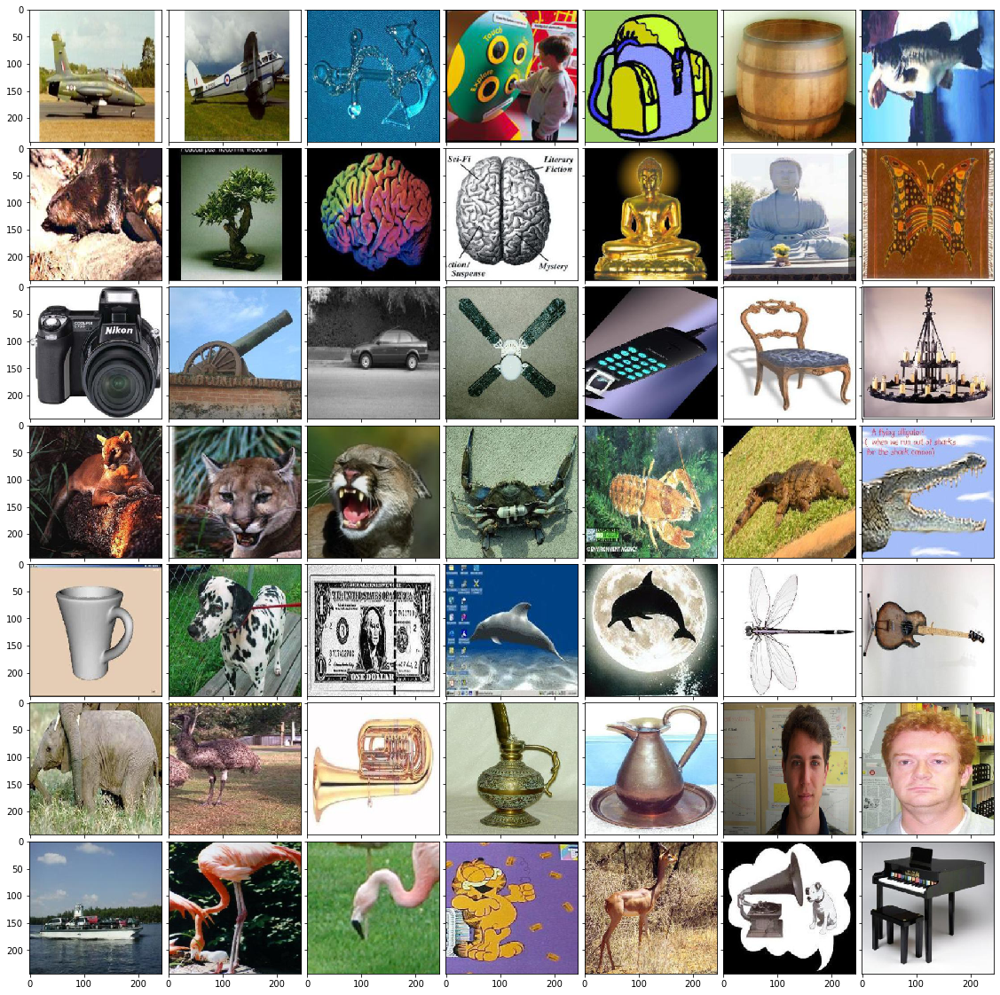

In [7]:
fig = plt.figure(1, (20., 20.))
grid = ImageGrid(fig, 111,  # similar to subplot(111)
                 nrows_ncols=(7, 7),  # creates 2x2 grid of axes
                 axes_pad=0.1,  # pad between axes in inch.
                 )

for i in range(49):
    grid[i].imshow(X_train[i*50][:][:][:])  # The AxesGrid object work as a list of axes.

plt.show()

In [8]:
from sklearn.model_selection import train_test_split
data_train, data_test, labels_train, labels_test = train_test_split(X_train, y_train, test_size=0.33, random_state=42)

In [9]:
np.shape(np.array(data_train))

(1766, 244, 244, 3)

<h3> Preprocess RBG images into Grayscale for PCA feature extraction </h3>

In [10]:
n_samples_train = np.shape(data_train)[0]
data_train_gray = np.zeros(shape=(n_samples_train,244,244))
for index in range(np.shape(data_train)[0]):
    data_train_gray[index][:][:] = rgb2gray(data_train[index][:][:][:])

In [11]:
n_samples_test = np.shape(data_test)[0]
data_test_gray = np.zeros(shape=(n_samples_test,244,244))
for index in range(n_samples_test):
        data_test_gray[index][:][:]= rgb2gray(data_test[index][:][:][:])

In [12]:
np.shape(np.array(data_train_gray))

(1766, 244, 244)

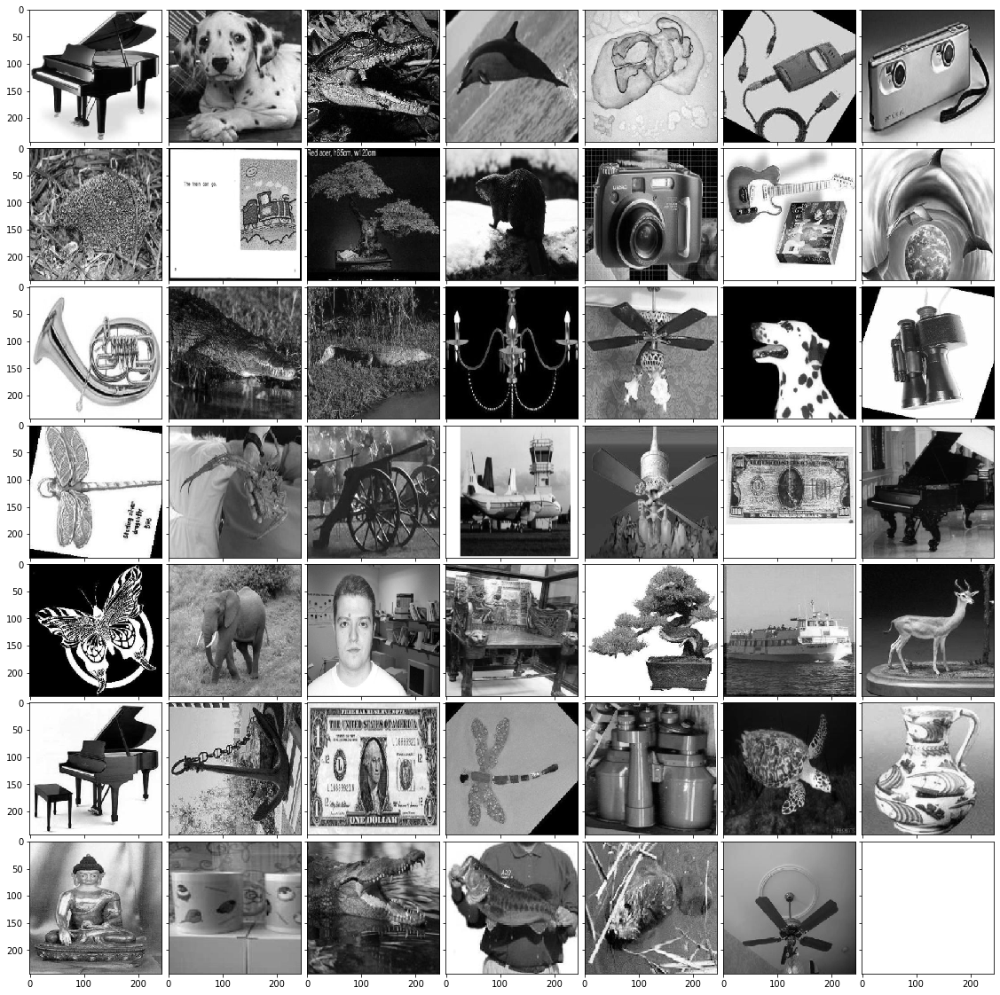

In [13]:
fig = plt.figure(1, (20., 20.))
grid = ImageGrid(fig, 111,  # similar to subplot(111)
                 nrows_ncols=(7, 7),  # creates 2x2 grid of axes
                 axes_pad=0.1,  # pad between axes in inch.
                 )

for i in range(48):
    grid[i].imshow(data_train_gray[i*35][:][:],cmap=plt.cm.gray)  # The AxesGrid object work as a list of axes.

plt.show()

In [14]:
dtrain_reshape = data_train_gray.reshape(n_samples_train,-1)

In [15]:
dtest_reshape = data_test_gray.reshape(n_samples_test,-1)

In [16]:
n_components = 150 
pca = RandomizedPCA(n_components=n_components, whiten=True).fit(dtrain_reshape)

In [17]:
print("Projecting the input data on the eigenobjects orthonormal basis")
X_train_pca = pca.transform(dtrain_reshape)
X_test_pca = pca.transform(dtest_reshape)

Projecting the input data on the eigenobjects orthonormal basis


<h3>Extract more statistical features from images </h3>

In [18]:
def fd_hu_moments(image):
    image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    feature = cv2.HuMoments(cv2.moments(image)).flatten()
    return feature
def fd_haralick(image):    # convert the image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    # compute the haralick texture feature vector
    haralick = mahotas.features.haralick(gray).mean(axis=0)
    return haralick
 
def fd_histogram(image, mask=None):
    # convert the image to HSV color-space
    image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    # compute the color histogram
    hist  = cv2.calcHist([image], [0, 1, 2], None, [4, 4, 4], [0, 256, 0, 256, 0, 256])
    # normalize the histogram
    cv2.normalize(hist, hist)
    return hist.flatten()

In [19]:
fd_haralick(data_train[1][:][:][:]).shape


(13,)

In [20]:
fd_hu_moments(data_train[1][:][:][:]).shape

(7,)

In [21]:
fd_histogram(data_train[1][:][:][:]).shape

(64,)

<h3> Stack, scale and append statistical image features to PCA features </h3>

In [22]:
global_feature_train = np.zeros(shape=(np.shape(data_train)[0],64+7+13))
for index in range(np.shape(data_train)[0]):
    global_feature_train[index][:] = np.hstack([fd_histogram(data_train[index][:][:][:]), fd_haralick(data_train[index][:][:][:]), fd_hu_moments(data_train[index][:][:][:])])


In [23]:
global_feature_test = np.zeros(shape=(np.shape(data_test)[0],64+7+13))
for index in range(np.shape(data_test)[0]):
    global_feature_test[index][:] = np.hstack([fd_histogram(data_test[index][:][:][:]), fd_haralick(data_test[index][:][:][:]), fd_hu_moments(data_test[index][:][:][:])])
    

In [24]:
global_features_final_train = np.hstack([global_feature_train,X_train_pca])
global_features_final_test  = np.hstack([global_feature_test ,X_test_pca ])

In [25]:
scaler = MinMaxScaler(feature_range=(0, 1))
rescaled_features_train = scaler.fit_transform(global_features_final_train)
rescaled_features_test  = scaler.fit_transform(global_features_final_test)

<h3> Implement SVC on training data </h3>

In [26]:
X, y = rescaled_features_train, labels_train
start = time.time()
svc_clf = OneVsRestClassifier(SVC(kernel='rbf', probability=True, class_weight='balanced'),n_jobs=4)
svc_clf.fit(X, y)
end = time.time()
print("Single SVC", end - start, svc_clf.score(X,y))
pred_svm = svc_clf.predict_proba(X)

Single SVC 296.2541010379791 0.43431483578708946


<h3> Generate classification report and cross tabulation scores for SVM on test data </h3>

In [27]:
print("Predicting object names on the SVM test set")
X = rescaled_features_test
y_pred = svc_clf.predict(X)
print(classification_report(labels_test,y_pred, target_names=catList[1:num_Folds]))

Predicting object names on the SVM test set
                   precision    recall  f1-score   support

        airplanes       0.85      0.79      0.81        14
           anchor       0.00      0.00      0.00        11
              ant       0.00      0.00      0.00        10
BACKGROUND_Google       0.00      0.00      0.00        22
           barrel       0.00      0.00      0.00        18
             bass       0.00      0.00      0.00        23
           beaver       0.06      0.06      0.06        16
        binocular       0.50      0.09      0.15        11
           bonsai       0.33      0.04      0.07        24
            brain       0.10      0.24      0.14        21
     brontosaurus       0.00      0.00      0.00        14
           buddha       0.50      0.12      0.19        17
        butterfly       0.40      0.09      0.14        23
           camera       0.13      0.73      0.22        11
           cannon       0.09      0.31      0.14        13
         ca

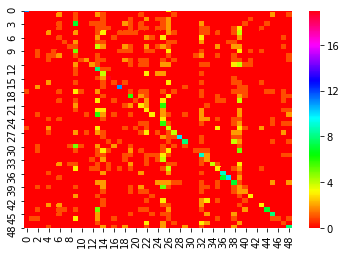

In [28]:
corr_mat = confusion_matrix(labels_test, y_pred)
sns.heatmap(corr_mat, cmap='hsv', annot_kws={'size':20})

<h3> Fit data to Random Forest Classifier </h3>

In [29]:
X, y = rescaled_features_train, labels_train
start = time.time()
rf_clf = RandomForestClassifier(min_samples_leaf=5)
rf_clf.fit(X, y)
end = time.time()
print("Random Forest", end - start, rf_clf.score(X,y))
pred_rf = rf_clf.predict_proba(X)

Random Forest 0.6352725028991699 0.8674971687429218


In [30]:
pred_rf1 = np.argmax(pred_rf, axis=1, out=None)

In [31]:
catList = listdir(path)
X = rescaled_features_test
y_pred = rf_clf.predict(X)
print("Predicting object names on the test set")
print(classification_report(labels_test, y_pred,target_names=catList[1:num_Folds]))

Predicting object names on the test set
                   precision    recall  f1-score   support

        airplanes       0.20      0.93      0.32        14
           anchor       0.00      0.00      0.00        11
              ant       0.00      0.00      0.00        10
BACKGROUND_Google       0.11      0.05      0.06        22
           barrel       0.00      0.00      0.00        18
             bass       0.00      0.00      0.00        23
           beaver       0.00      0.00      0.00        16
        binocular       0.22      0.18      0.20        11
           bonsai       0.00      0.00      0.00        24
            brain       0.18      0.29      0.22        21
     brontosaurus       0.00      0.00      0.00        14
           buddha       0.07      0.06      0.06        17
        butterfly       0.00      0.00      0.00        23
           camera       0.14      0.36      0.21        11
           cannon       0.14      0.08      0.10        13
         car_si

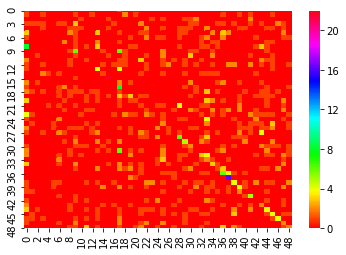

In [32]:
corr_mat = confusion_matrix(labels_test, y_pred)
sns.heatmap(corr_mat, cmap='hsv', annot_kws={'size':20})

<h3> Fit data to Logistic Regression Classifier </h3>

In [33]:
X, y = rescaled_features_train, labels_train
start = time.time()
logit_clf = OneVsRestClassifier(LogisticRegression(solver='lbfgs'),n_jobs=4)
logit_clf.fit(X, y)
end = time.time()
print("Random Forest", end - start, logit_clf.score(X,y))
pred_rf =logit_clf.predict_proba(X)

Random Forest 25.013036727905273 0.6189127972819932


In [34]:
X = rescaled_features_test
y_pred = logit_clf.predict(X)
print("Predicting object names on the Logistic Regression test set")
print(classification_report(labels_test, y_pred,target_names=catList[1:num_Folds]))

Predicting object names on the Logistic Regression test set
                   precision    recall  f1-score   support

        airplanes       0.26      1.00      0.42        14
           anchor       0.20      0.09      0.13        11
              ant       0.11      0.10      0.11        10
BACKGROUND_Google       0.00      0.00      0.00        22
           barrel       0.00      0.00      0.00        18
             bass       0.00      0.00      0.00        23
           beaver       0.00      0.00      0.00        16
        binocular       1.00      0.09      0.17        11
           bonsai       0.17      0.04      0.07        24
            brain       0.24      0.38      0.29        21
     brontosaurus       0.00      0.00      0.00        14
           buddha       0.38      0.29      0.33        17
        butterfly       0.50      0.13      0.21        23
           camera       0.33      0.55      0.41        11
           cannon       0.13      0.31      0.18      

In [35]:
np.shape(catList[0:50])

(50,)

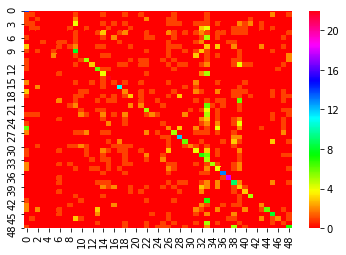

In [36]:
import seaborn as sns
corr_mat = confusion_matrix(labels_test, y_pred)
sns.heatmap(corr_mat, cmap='hsv', annot_kws={'size':20})

<h3> Introduce Dask for faster processing for SVM </h3>

In [37]:
cluster = LocalCluster(n_workers=4)

In [38]:
client = Client(cluster)
client


Client Scheduler: tcp://127.0.0.1:58089 Dashboard: http://127.0.0.1:8787/status,Cluster Workers: 4 Cores: 4 Memory: 8.00 GB


<h3> Parameter Search for SVC </h3>

In [39]:
print("Fitting the classifier to the training set")
param_grid = {'C': [1e3, 5e3, 1e4, 5e4, 1e5],
              'gamma': [0.0001, 0.0005, 0.001, 0.005, 0.01, 0.1], }
clf = GridSearchCV(SVC(kernel='rbf', class_weight='balanced'), param_grid,n_jobs=4)

with joblib.parallel_backend("dask", scatter=[rescaled_features_train, labels_train]):
                   clf.fit(rescaled_features_train, labels_train)
        
print("Best estimator found by grid search:")
print(clf.best_estimator_)

Fitting the classifier to the training set
Best estimator found by grid search:
SVC(C=1000.0, cache_size=200, class_weight='balanced', coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma=0.1, kernel='rbf',
    max_iter=-1, probability=False, random_state=None, shrinking=True,
    tol=0.001, verbose=False)


<h3> 26% is not a good score at all </h3>

In [40]:
clf.best_estimator_.score(rescaled_features_test,labels_test)

0.2517241379310345

In [41]:
svc_clf = clf

In [42]:
print("Predicting object names on the test set")
y_pred = clf.predict(rescaled_features_test)
sv_classreport = classification_report(labels_test, y_pred, target_names=catList[1:50])
print(classification_report(labels_test, y_pred, target_names=catList[1:50]))
#print(confusion_matrix(labels_test, y_pred,labels = catList[1:257])))

Predicting object names on the test set
                   precision    recall  f1-score   support

        airplanes       0.92      0.86      0.89        14
           anchor       0.07      0.27      0.12        11
              ant       0.08      0.20      0.12        10
BACKGROUND_Google       0.07      0.18      0.11        22
           barrel       0.00      0.00      0.00        18
             bass       0.00      0.00      0.00        23
           beaver       0.00      0.00      0.00        16
        binocular       0.50      0.18      0.27        11
           bonsai       0.50      0.08      0.14        24
            brain       0.42      0.38      0.40        21
     brontosaurus       0.09      0.07      0.08        14
           buddha       0.36      0.24      0.29        17
        butterfly       0.27      0.17      0.21        23
           camera       0.32      0.64      0.42        11
           cannon       0.09      0.31      0.14        13
         car_si

<h3> Lets perform cross validation with best SVC estimator </h3>

In [43]:
from sklearn.model_selection import cross_val_score
training_score = cross_val_score(svc_clf.best_estimator_, rescaled_features_train, labels_train, cv=5)

In [44]:
training_score

array([0.26954178, 0.28374656, 0.25779037, 0.2994186 , 0.28358209])

In [45]:
predict_train = svc_clf.best_estimator_.predict(rescaled_features_train)
predict_test  = svc_clf.best_estimator_.predict(rescaled_features_test)

In [46]:
print(classification_report(labels_test, predict_test, target_names=catList[1:50]))

                   precision    recall  f1-score   support

        airplanes       0.92      0.86      0.89        14
           anchor       0.07      0.27      0.12        11
              ant       0.08      0.20      0.12        10
BACKGROUND_Google       0.07      0.18      0.11        22
           barrel       0.00      0.00      0.00        18
             bass       0.00      0.00      0.00        23
           beaver       0.00      0.00      0.00        16
        binocular       0.50      0.18      0.27        11
           bonsai       0.50      0.08      0.14        24
            brain       0.42      0.38      0.40        21
     brontosaurus       0.09      0.07      0.08        14
           buddha       0.36      0.24      0.29        17
        butterfly       0.27      0.17      0.21        23
           camera       0.32      0.64      0.42        11
           cannon       0.09      0.31      0.14        13
         car_side       0.87      0.87      0.87       

<h3> Lets try parameter search for Logistic Regression </h3>

In [47]:
print("Fitting the classifier to the training set")
param_grid = {'penalty' : ['l2'],'C': [0.001, 0.01, 0.1, 1, 10, 100, 1000], }
logit_clf = GridSearchCV(LogisticRegression(solver='lbfgs',verbose=1), param_grid,n_jobs=4)


Fitting the classifier to the training set


In [48]:
training_score = cross_val_score(LogisticRegression(solver='lbfgs'), rescaled_features_train, labels_train, cv=5,verbose=1,n_jobs=-1)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:   23.3s finished


In [49]:
training_score

array([0.26954178, 0.27272727, 0.26628895, 0.26744186, 0.24477612])

In [50]:
from sklearn.neighbors import KNeighborsClassifier
training_score_knn = cross_val_score(KNeighborsClassifier(n_neighbors=49),rescaled_features_train,labels_train,cv=5,n_jobs=-1)

In [51]:
training_score_knn

array([0.16172507, 0.17906336, 0.12464589, 0.1627907 , 0.15522388])

<h3> Random Forest </h3>

In [52]:
training_score_rf = cross_val_score(RandomForestClassifier(min_samples_leaf=40), rescaled_features_train, labels_train, cv=5,verbose=1,n_jobs=-1)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    1.4s finished


In [53]:
training_score_rf

array([0.1509434 , 0.16253444, 0.16147309, 0.19476744, 0.18507463])

<h3> Analysis of Images with High Accuracy </h3>

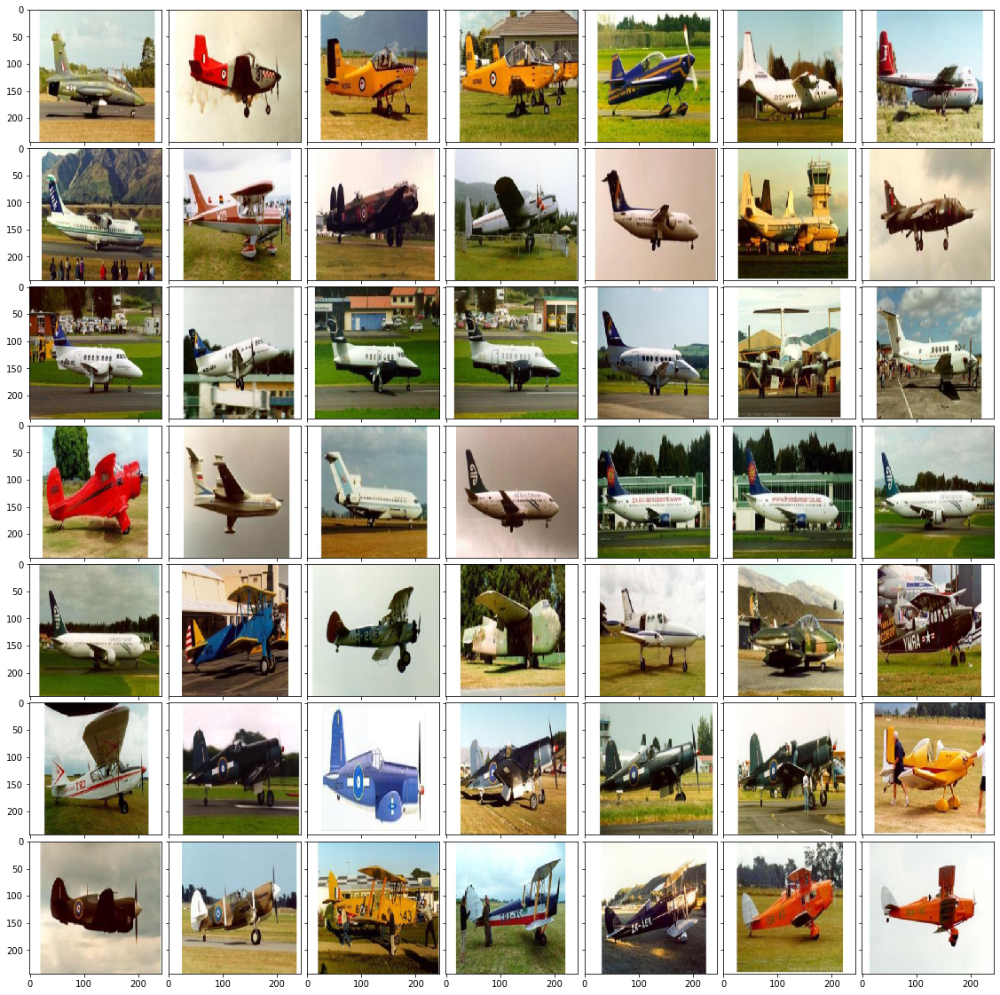

In [54]:
fig = plt.figure(1, (20., 20.))
grid = ImageGrid(fig, 111,  # similar to subplot(111)
                 nrows_ncols=(7, 7),  # creates 2x2 grid of axes
                 axes_pad=0.1,  # pad between axes in inch.
                 )

for i in range(49):
    grid[i].imshow(X_train[i][:][:][:])  # The AxesGrid object work as a list of axes.

plt.show()

<h3> Analysis of Images with good vs bad classification accuracy </h3>

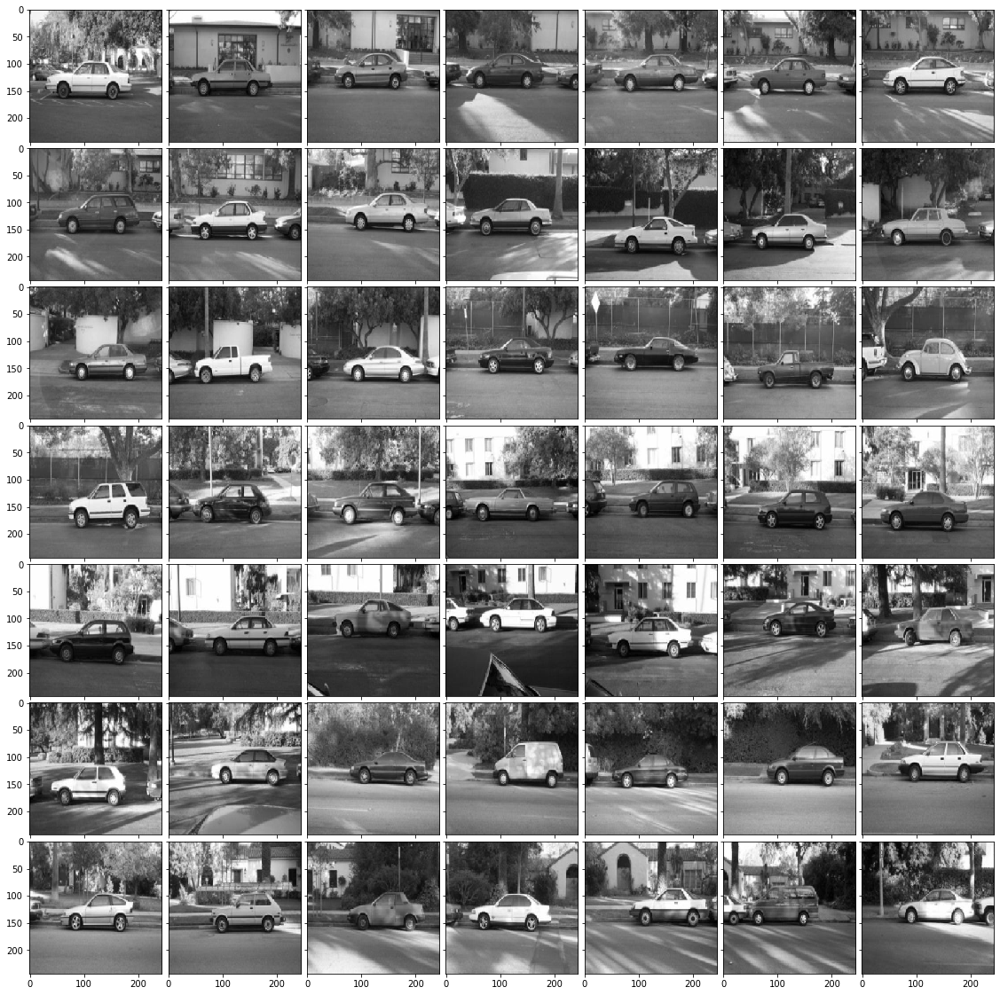

In [71]:
#Car Side
fig = plt.figure(1, (20., 20.))
grid = ImageGrid(fig, 111,  # similar to subplot(111)
                 nrows_ncols=(7, 7),  # creates 2x2 grid of axes
                 axes_pad=0.1,  # pad between axes in inch.
                 )

for i in range(49):
    grid[i].imshow(X_train[i+np.sum(y_index[0:15])][:][:][:])  # The AxesGrid object work as a list of axes.

plt.show()

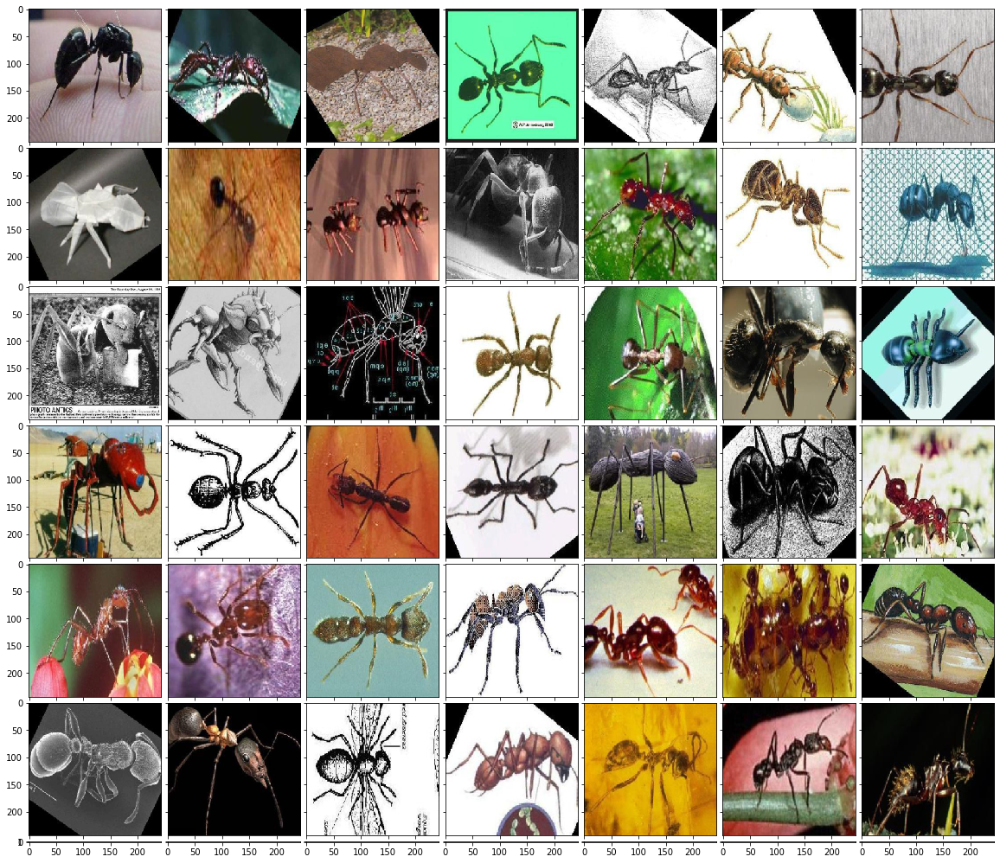

In [72]:
#Background
fig = plt.figure(1, (20., 20.))
grid = ImageGrid(fig, 111,  # similar to subplot(111)
                 nrows_ncols=(7, 7),  # creates 2x2 grid of axes
                 axes_pad=0.1,  # pad between axes in inch.
                 )

for i in range(42):
    grid[i].imshow(X_train[i+np.sum(y_index[0:2])][:][:][:])  # The AxesGrid object work as a list of axes.

plt.show()

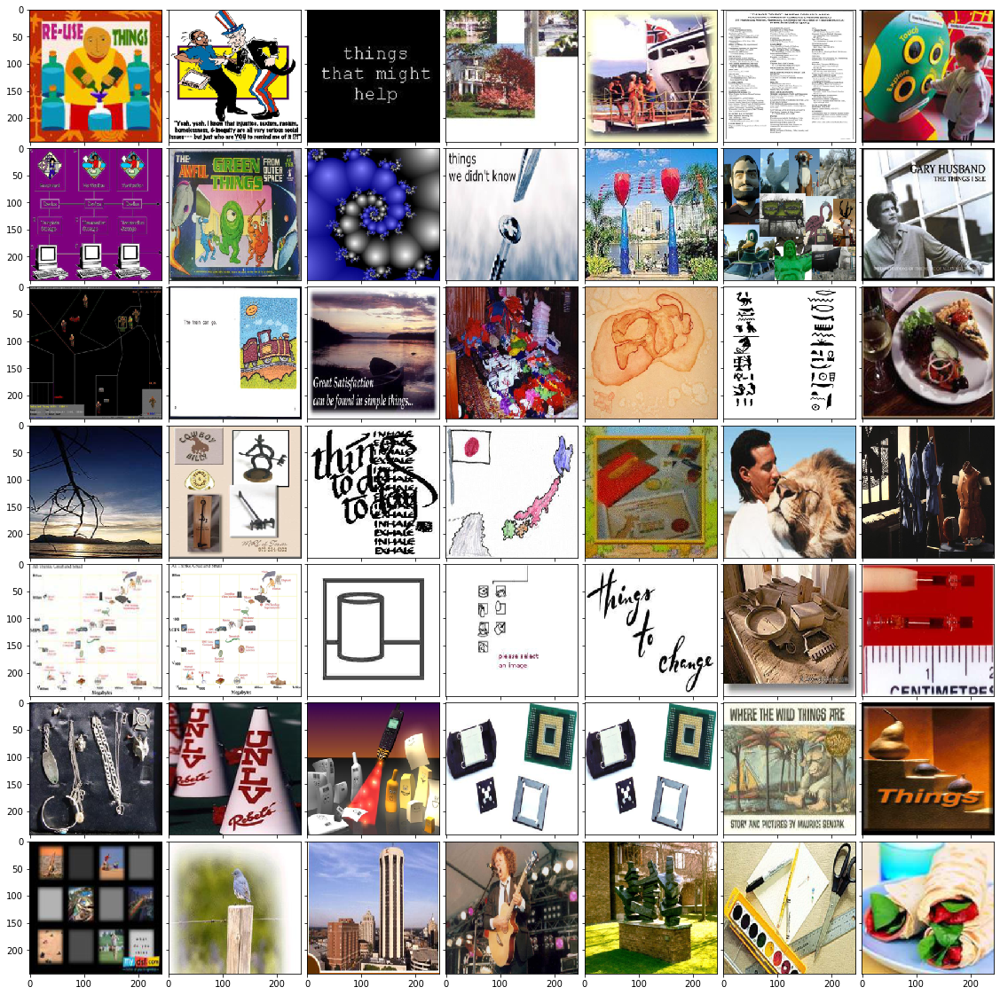

In [73]:
#Barrels
fig = plt.figure(1, (20., 20.))
grid = ImageGrid(fig, 111,  # similar to subplot(111)
                 nrows_ncols=(7, 7),  # creates 2x2 grid of axes
                 axes_pad=0.1,  # pad between axes in inch.
                 )

for i in range(49):
    grid[i].imshow(X_train[i+np.sum(y_index[0:3])][:][:][:])  # The AxesGrid object work as a list of axes.

plt.show()

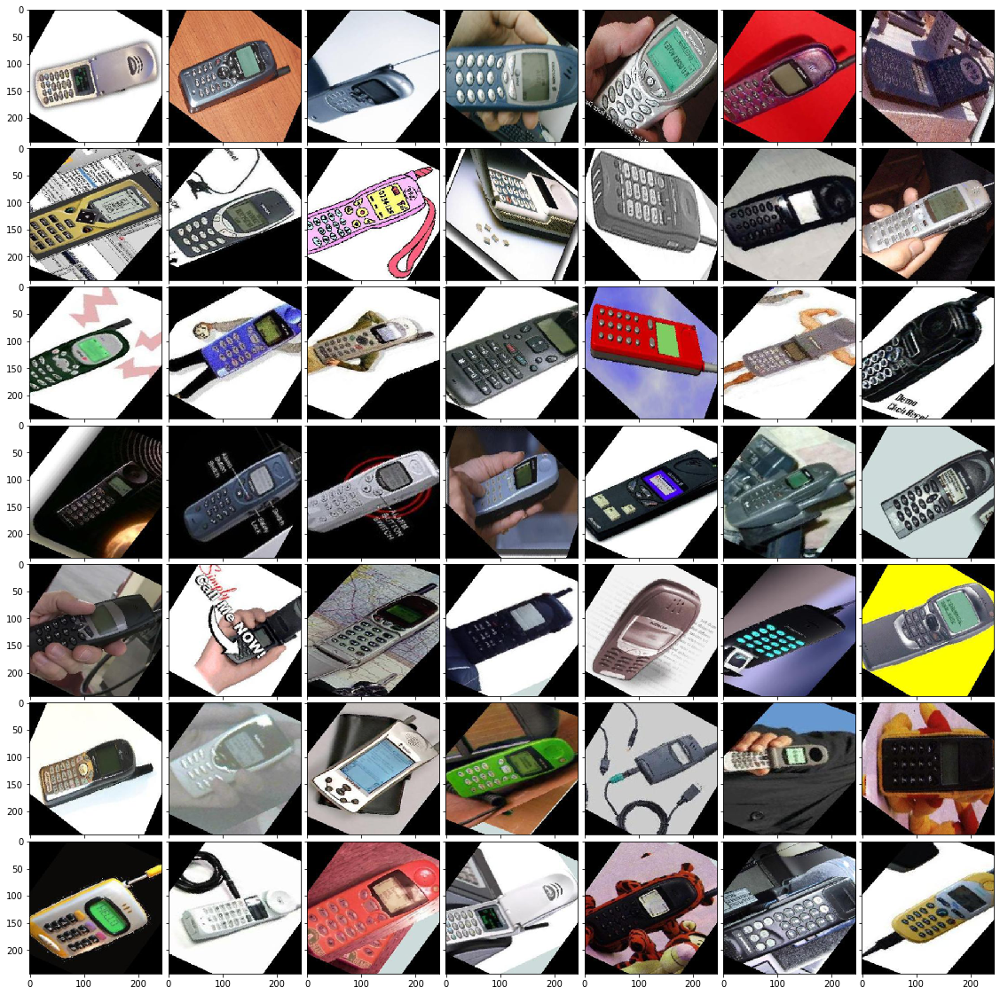

In [74]:
#Barrels
fig = plt.figure(1, (20., 20.))
grid = ImageGrid(fig, 111,  # similar to subplot(111)
                 nrows_ncols=(7, 7),  # creates 2x2 grid of axes
                 axes_pad=0.1,  # pad between axes in inch.
                 )

for i in range(49):
    grid[i].imshow(X_train[i+np.sum(y_index[0:17])][:][:][:])  # The AxesGrid object work as a list of axes.

plt.show()

<h3> Conclusions </h3>
<p> Images with higher variation seem to perform more poorly in terms of accuracy when classifying object classes. 
    A dataset with less variation (ie less changes in background, image color and orientation) could provide better performance     than dataset used in this notebook. Suggest using labeled faces in the wild dataset to test premise </p>